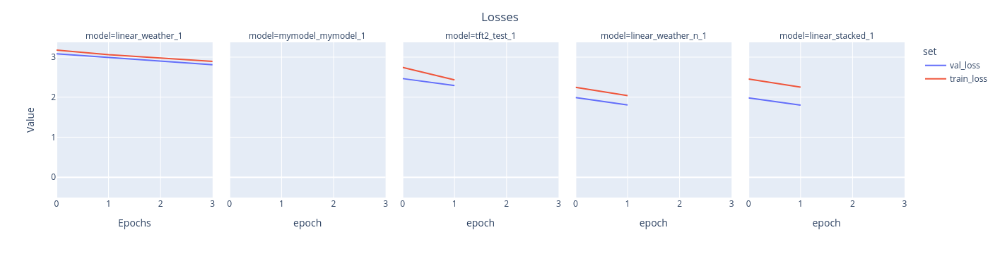

In [2]:
import plotly.express as px
import pandas as pd
import numpy as np
##Check the losses trend
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/test/csv/prova_test_LOSSES.csv')
fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model',width = 2600)
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses

In [3]:
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/test/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)


In [4]:
tot_pred

,Unnamed: 0,lag,time,y,y_low,y_median,y_high,model
0,0,1,2020-10-19 22:00:00,0.743537,-0.460268,-0.128461,-0.129860,linear_weather_1
504432,504432,1,2020-10-19 22:00:00,0.743537,0.569345,0.724049,0.938370,linear_weather_n_1
336288,336288,1,2020-10-19 22:00:00,0.743537,-0.924454,0.322944,1.349962,tft2_test_1
168144,168144,1,2020-10-19 22:00:00,0.743537,-0.320984,-0.224796,0.264523,mymodel_mymodel_1
672576,672576,1,2020-10-19 22:10:00,0.108656,-0.097971,-0.904626,0.679239,linear_stacked_1
...,...,...,...,...,...,...,...,...
672575,672575,16,2020-12-31 23:50:00,0.479529,-0.198256,0.345375,0.387218,linear_weather_n_1
504431,504431,16,2020-12-31 23:50:00,0.479529,-0.931094,0.293304,1.357370,tft2_test_1
336287,336287,16,2020-12-31 23:50:00,0.479529,-0.193487,-0.097960,0.203712,mymodel_mymodel_1
168143,168143,16,2020-12-31 23:50:00,0.479529,-0.567855,0.060142,-0.826659,linear_weather_1


In [5]:
##some models does not give you the quantiles so, for seek of comparison, you can do this workaroud
tot_pred.y_pred[np.isnan(tot_pred.y_pred)] = tot_pred.y_median[np.isnan(tot_pred.y_pred)] 

AttributeError: 'DataFrame' object has no attribute 'y_pred'

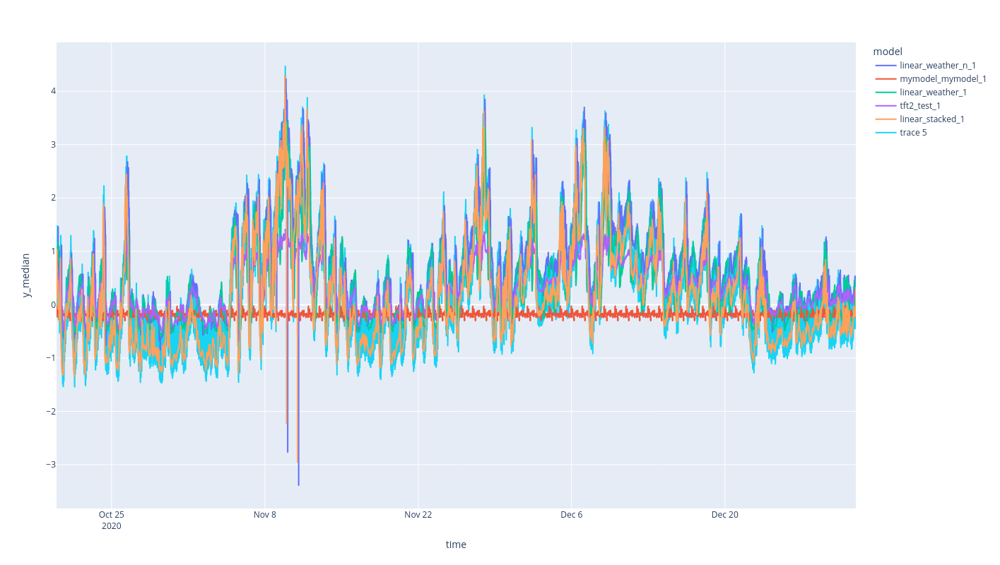

In [6]:
##let see how the prediction at step 10 are
lag=10

fig = px.line(tot_pred[(tot_pred.lag==lag)], x='time', y='y_median', color='model',height=800)
fig.add_scatter(x = tot_pred[tot_pred.lag==lag].time, y=tot_pred[tot_pred.lag==lag].y)


In [16]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: np.nanmean((x.y-x.y_pred)**2)).reset_index().rename(columns={0:'error'}) 


In [7]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_median)/x.y)).reset_index().rename(columns={0:'error'}) 


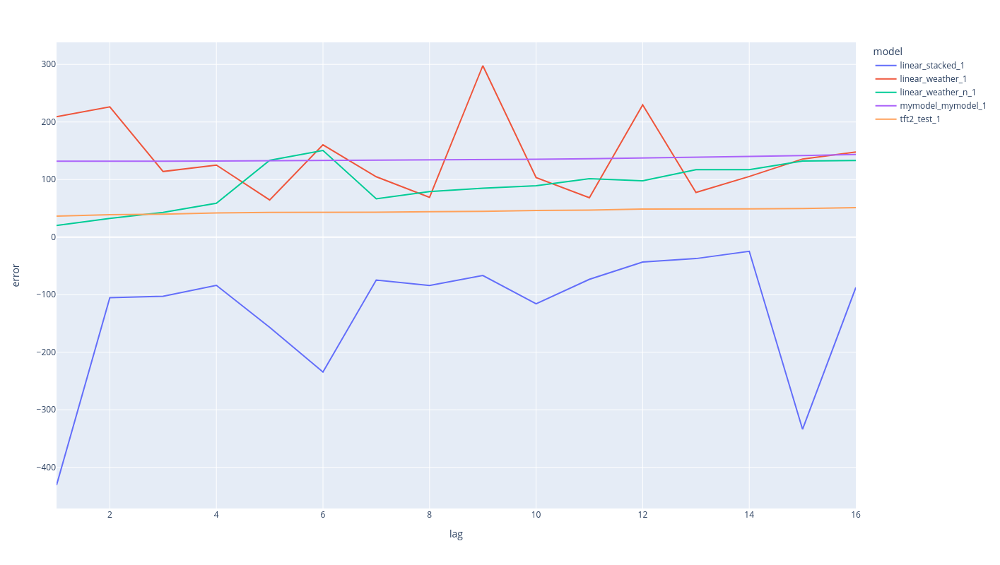

In [8]:
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show()